In [1]:
%pylab inline

import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap.sparse import darkmapper
from ddmap import detect3D
from ddmap.halolet import massmap_ks2D

Populating the interactive namespace from numpy and matplotlib


In [2]:
# configuration
configName  =   '../../tests/config_sparse.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('sparse','mu','3e-4')
if False:
    atomFname='../../tests/haloBasis-nl10-pix48-m146_152.fits'
    parser.set('lens','atomFname',atomFname)
    parser.set('sparse','nframe','1' )
else:
    parser.set('lens','resolve_lim','0.2') #pix
    parser.set('lens','rs_base','0.31')    #Mpc/h
    parser.set('sparse','nframe','1' )
    
# Pixelation
gridInfo=   cartesianGrid3D(parser)
Z,Y,X   =   np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
x,y,z   =   (X.flatten(),Y.flatten(),Z.flatten())
lensKer1 =   gridInfo.lensing_kernel(deltaIn=False)
lensKer2 =   gridInfo.lensing_kernel(deltaIn=True)

In [16]:
z_h     =  0.2425
log_m   =  14.745
M_200   =  10.**(log_m)
conc    =  4.#6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lk      =  halo.lensKernel(z)
data1   =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lk
data1   =  data1.reshape(gridInfo.shape)

ks2D=massmap_ks2D(gridInfo.ny,gridInfo.nx)
rpix=halo.rs_arcsec/gridInfo.scale/3600.
sigma=halosim.haloCS02SigmaAtom(rpix,ny=gridInfo.ny,nx=gridInfo.nx,\
                                smooth_scale=-1,c=halo.c,fou=True)
shear=np.fft.fftshift(ks2D.transform(sigma,inFou=True,outFou=False))
lk2=lk.reshape(gridInfo.shape)
data2=shear[None,:,:]*lk2*2e15
if True:
    noistd=0.01
    data2=data2+np.random.randn(gridInfo.nz,gridInfo.ny,gridInfo.nx)*noistd
    gErr    =  np.ones(gridInfo.shape)*noistd
else:
    gErr    =  np.ones(gridInfo.shape)*0.1
    
dmapper=darkmapper(parser,data2.real,data2.imag,gErr,lensKer1)

In [17]:
halo.rs

0.3089626902665355

5127461845348200.0


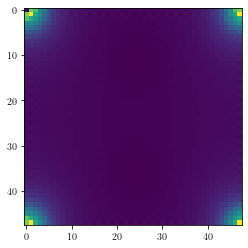

In [18]:
plt.imshow(np.abs(dmapper.modelDict.aframes[4,0]))
print(np.sum(np.abs(dmapper.modelDict.aframes[4,0])))

21.301907180136297


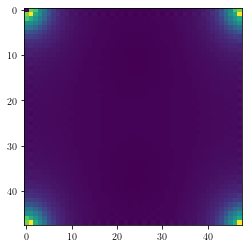

In [19]:
plt.imshow(np.abs(np.fft.ifftshift(shear)))
print(np.sum(np.abs(np.fft.ifftshift(shear))))

5127461845348180.0


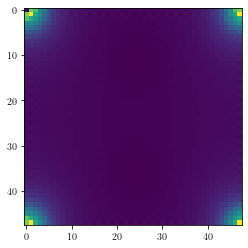

In [20]:
res=np.abs(dmapper.modelDict.aframes[4,0]-np.fft.ifftshift(shear))
print(np.sum(res))
plt.imshow(res)

# sparse analysis

CPU times: user 2.28 s, sys: 3.38 ms, total: 2.28 s
Wall time: 2.28 s


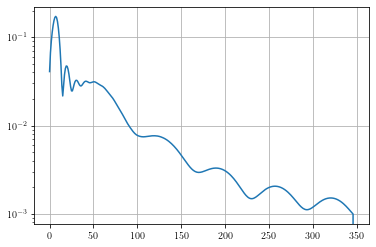

In [21]:
%%time
if False:
    dmapper.lbd=8.
    dmapper.lcd=0.
    dmapper.nonNeg=True
    dmapper.clean_outcomes()
    dmapper.fista_gradient_descent(3000)
else:
    dmapper.lbd=0.
    dmapper.lcd=1.
    dmapper.nonNeg=False
    dmapper.clean_outcomes()
    dmapper.optimized_gradient_descent(3000)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 17.6 s, sys: 210 µs, total: 17.6 s
Wall time: 17.7 s


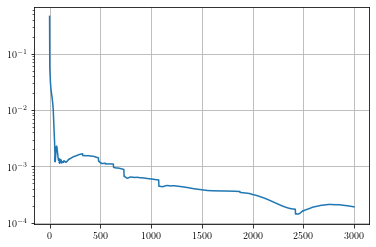

In [22]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

CPU times: user 18.1 s, sys: 3.37 ms, total: 18.1 s
Wall time: 18.2 s


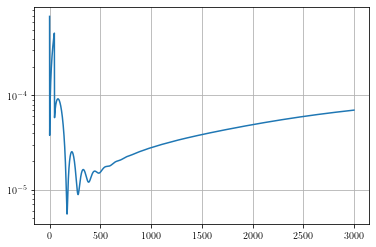

In [23]:
%%time
dmapper.lbd=8.
dmapper.lcd=0.
dmapper.nonNeg=True
w   =   dmapper.adaptive_lasso_weight(gamma=2.)
dmapper.fista_gradient_descent(3000,w=w)
dmapper.reconstruct()
plt.plot(dmapper.diff)
plt.yscale('log')
plt.grid()

In [24]:
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(dmapper.deltaR[:,:,:])
data1   =   np.hstack([c1,v1[:,None]])
src     =   Table(data=data1,names=names)

In [25]:
src

iz,iy,ix,value
float64,float64,float64,float64
4.0,24.0,24.0,70.63326956555217


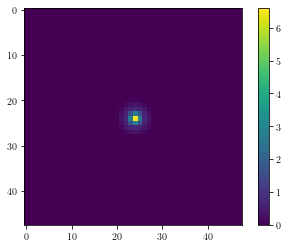

In [27]:
plt.imshow(dmapper.deltaR[4])
plt.colorbar()